# HW 3 Schelling model. Roman Branovets, Skoltech, 2025


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [ ]:
np.random.seed(42)
size = 50*50
shape = 50
grid = np.array([0]*(size//2)+[1]*(size//2 + size % 2))
np.random.shuffle(grid)
initgrid = np.reshape(grid, (shape, shape))

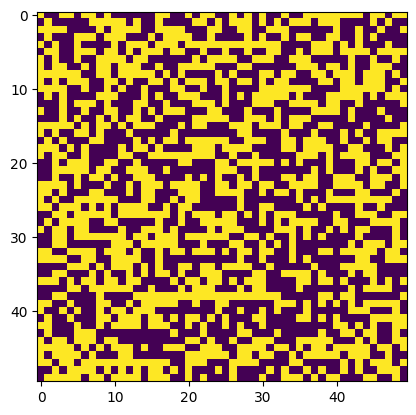

In [ ]:
plt.imshow(initgrid)

In [ ]:
def gif(history, R):
    fig, ax = plt.subplots(figsize=(8, 8))
    im = ax.imshow(history[0], interpolation='nearest')
    ax.set_title(f"R = {R:.3f} frame 0/{len(history)-1}")
    ax.axis('off')
    def update(frame):
        im.set_array(history[frame])
        ax.set_title(f"R = {R:.3f}")
        return [im]

    ani = FuncAnimation(fig, update, frames=len(history), interval=200, blit=True)
    plt.close(fig)
    return HTML(ani.to_jshtml())

In [ ]:
R = np.array([0, 1/8, 1/4, 3/8, 1/2, 5/8, 3/4, 7/8, 1.0])
mi = 100
def mask(grid):
    numsame = np.zeros_like(grid)
    for di, dj in [(-1,0),(1,0),(0,-1),(0,1),(-1,-1),(-1,1),(1,-1),(1,1)]:
        neingbour = np.roll(np.roll(grid, di, axis=0), dj, axis=1)
        numsame += neingbour == grid
    return numsame
dissum = {}
for i in R:
    grid = initgrid.copy()
    history = [grid.copy()]
    dissum[i] = np.zeros((mi))
    for j in range(mi):
        ratio = np.empty_like(grid)
        ratio = mask(grid) / 8
        dissat = np.empty_like(grid)
        dissat = ratio < i
        dissum[i][j] = np.sum(dissat)
        if np.sum(dissat) == 0:
            break
        dissidx = np.empty_like(dissat)
        dissidx = np.argwhere(dissat)
        np.random.shuffle(dissidx)
        tosatis = np.array(dissidx)
        np.random.shuffle(tosatis)
        agents = grid[dissidx[:,0], dissidx[:,1]].copy()
        grid[tosatis[:,0], tosatis[:,1]] = agents
        history.append(grid.copy())
    display(gif(history, i))

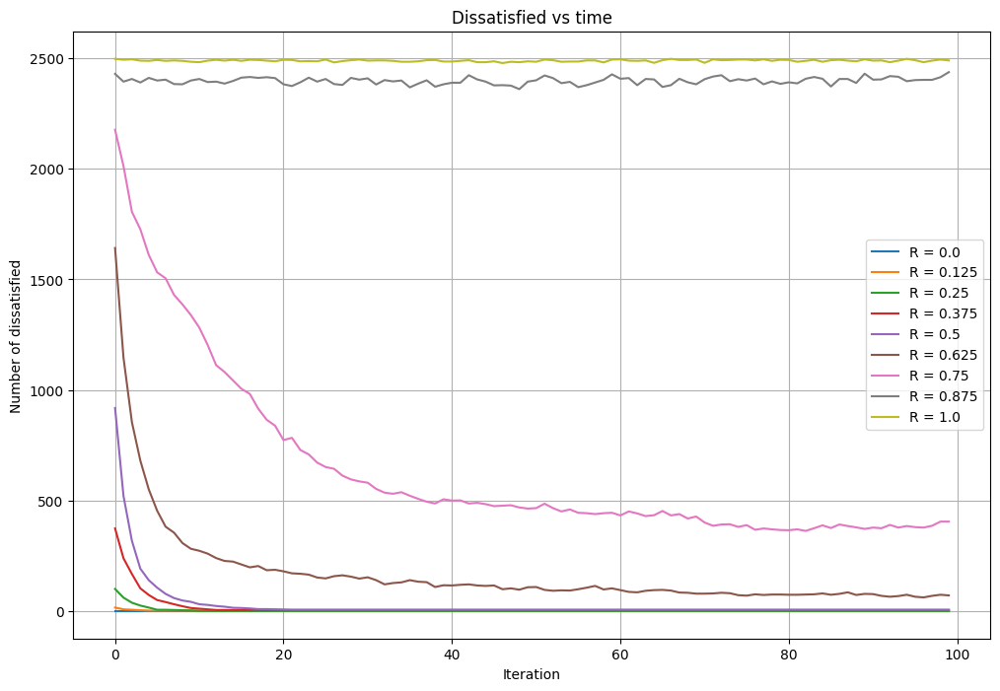

In [ ]:
plt.figure(figsize=(12, 8))
for i in R:
    plt.plot(np.arange(mi), dissum[i][:], label=f'R = {i}')
plt.xlabel('Iteration')
plt.ylabel('Number of dissatisfied')
plt.title("Dissatisfied vs time")
plt.legend()
plt.grid()
plt.show()